In [58]:
import tensorflow as tf
import numpy as np
import os
import cv2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [59]:
os.environ["PYTHONHASHSEED"] = str(42)
tf.random.set_seed(42)
np.random.seed(42)

In [60]:
IMAGE_SIZE = 1536
PATCH_SIZE = 256
BATCH_SIZE = 2
EPOCHS = 1
LEARNING_RATE = 0.0001

In [61]:
noisy_path = r"C:\Users\91909\Desktop\ML\DATA\NTIRE\noisy_data\DIV2K\DIV2K_train_HR\DIV2K_train_HR"
clean_path = r"C:\Users\91909\Desktop\ML\DATA\NTIRE\clean_data\DIV2K\DIV2K_train_HR\DIV2K_train_HR"

clean_test_path = r"C:\Users\91909\Desktop\ML\DATA\NTIRE\clean_data\DIV2K\DIV2K_valid_HR\DIV2K_valid_HR"
noisy_test_path = r"C:\Users\91909\Desktop\ML\DATA\NTIRE\noisy_data\DIV2K\DIV2K_valid_HR\DIV2K_valid_HR"



# noisy_path = r"C:\Users\91909\Desktop\ML\DATA\NTIRE\noisy_data\DIV2K\DIV2K_train_HR"
# clean_path = r"C:\Users\91909\Desktop\ML\DATA\NTIRE\clean_data\DIV2K\DIV2K_train_HR"

# clean_test_path = r"C:\Users\91909\Desktop\ML\DATA\NTIRE\clean_data\DIV2K\DIV2K_valid_HR"
# noisy_test_path = r"C:\Users\91909\Desktop\ML\DATA\NTIRE\noisy_data\DIV2K\DIV2K_valid_HR"

In [62]:
def load_image_generator(path):
    for file in os.listdir(path):
        img = cv2.imread(os.path.join(path, file))
        img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
        img = img.astype(np.float32) / 255.0
        yield img

In [63]:
def extract_patches(img):
    patches = []
    for i in range(0, IMAGE_SIZE, PATCH_SIZE):
        for j in range(0, IMAGE_SIZE, PATCH_SIZE):
            patch = img[i:i+PATCH_SIZE, j:j+PATCH_SIZE]
            if patch.shape[:2] == (PATCH_SIZE, PATCH_SIZE):
                patches.append(patch)
    return np.array(patches)

In [64]:
def data_generator(noisy_path, clean_path):
    for noisy_img, clean_img in zip(load_image_generator(noisy_path), load_image_generator(clean_path)):
        noisy_patches = extract_patches(noisy_img)
        clean_patches = extract_patches(clean_img)
        for i in range(len(noisy_patches)):
            yield noisy_patches[i], clean_patches[i]

In [65]:
dataset = tf.data.Dataset.from_generator(
    lambda: data_generator(noisy_path, clean_path),
    output_signature=(tf.TensorSpec(shape=(PATCH_SIZE, PATCH_SIZE, 3), dtype=tf.float32),
                      tf.TensorSpec(shape=(PATCH_SIZE, PATCH_SIZE, 3), dtype=tf.float32))
)

In [66]:
dataset = dataset.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [67]:
inp = Input(shape=(PATCH_SIZE, PATCH_SIZE, 3))
x = Conv2D(64, (3, 3), padding='same')(inp)
x = Activation('relu')(x)
for _ in range(15):
    x = Conv2D(64, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
x = Conv2D(3, (3, 3), padding='same')(x)
output = tf.keras.layers.Subtract()([inp, x])

model = Model(inputs=inp, outputs=output)

In [68]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_46 (Conv2D)             (None, 256, 256, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 activation_32 (Activation)     (None, 256, 256, 64  0           ['conv2d_46[0][0]']              
                                )                                                           

In [69]:
model.compile(optimizer=Adam(LEARNING_RATE), loss='mse')
early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

In [70]:
model.fit(dataset, epochs=EPOCHS, batch_size=BATCH_SIZE, callbacks=[early_stop])

14400/14400 [==============================] - 3481s 242ms/step - loss: 0.0050


In [76]:
model.save("tf_denoiser.h5")

In [71]:
def denoise_and_stitch(noisy_test_path):
    denoised_images = []
    for img in load_image_generator(noisy_test_path):
        patches = extract_patches(img)
        denoised_patches = model.predict(patches)
        stitched_image = np.zeros((IMAGE_SIZE, IMAGE_SIZE, 3))
        count = np.zeros((IMAGE_SIZE, IMAGE_SIZE, 1))
        idx = 0
        for i in range(0, IMAGE_SIZE, PATCH_SIZE):
            for j in range(0, IMAGE_SIZE, PATCH_SIZE):
                stitched_image[i:i+PATCH_SIZE, j:j+PATCH_SIZE] += denoised_patches[idx]
                count[i:i+PATCH_SIZE, j:j+PATCH_SIZE] += 1
                idx += 1
        denoised_images.append(stitched_image / count)
    return np.array(denoised_images)

In [72]:
denoised_images = denoise_and_stitch(noisy_test_path)

2/2 [==============================] - 1s 1s/step


MemoryError: Unable to allocate 27.0 MiB for an array with shape (36, 256, 256, 3) and data type float32

In [73]:
import matplotlib.pyplot as plt

def plot_test_results(noisy_test_path, clean_test_path, denoised_images):
    file_list = os.listdir(noisy_test_path)
    random_idx = np.random.randint(len(file_list))
    
    noisy_img = cv2.imread(os.path.join(noisy_test_path, file_list[random_idx]))
    noisy_img = cv2.resize(noisy_img, (IMAGE_SIZE, IMAGE_SIZE))
    noisy_img = noisy_img.astype(np.float32) / 255.0
    
    clean_img = cv2.imread(os.path.join(clean_test_path, file_list[random_idx]))
    clean_img = cv2.resize(clean_img, (IMAGE_SIZE, IMAGE_SIZE))
    clean_img = clean_img.astype(np.float32) / 255.0
    
    denoised_img = denoised_images[random_idx]
    
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(noisy_img)
    plt.title("Noisy Image")
    plt.axis("off")
    
    plt.subplot(1, 3, 2)
    plt.imshow(denoised_img)
    plt.title("Denoised Image")
    plt.axis("off")
    
    plt.subplot(1, 3, 3)
    plt.imshow(clean_img)
    plt.title("Ground Truth")
    plt.axis("off")
    
    plt.show()

In [74]:
plot_test_results(noisy_test_path, clean_test_path, denoised_images)

NameError: name 'denoised_images' is not defined

In [90]:
import os
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt

# Define image and patch size
IMAGE_SIZE = 1536
PATCH_SIZE = 256

# Load the trained model
model = tf.keras.models.load_model(r"C:\Users\91909\Desktop\ML\NTIRE_2025\tf_denoiser.h5")

def extract_patches(img):
    patches = []
    positions = []
    for i in range(0, IMAGE_SIZE, PATCH_SIZE):
        for j in range(0, IMAGE_SIZE, PATCH_SIZE):
            patch = img[i:i+PATCH_SIZE, j:j+PATCH_SIZE]
            if patch.shape[:2] == (PATCH_SIZE, PATCH_SIZE):
                patches.append(patch)
                positions.append((i, j))
    return np.array(patches), positions

def stitch_patches(denoised_patches, positions):
    stitched_image = np.zeros((IMAGE_SIZE, IMAGE_SIZE, 3))
    count = np.zeros((IMAGE_SIZE, IMAGE_SIZE, 1))
    
    for (patch, (i, j)) in zip(denoised_patches, positions):
        stitched_image[i:i+PATCH_SIZE, j:j+PATCH_SIZE] += patch
        count[i:i+PATCH_SIZE, j:j+PATCH_SIZE] += 1
    
    return stitched_image / count

def denoise_single_image(noisy_img):
    patches, positions = extract_patches(noisy_img)
    denoised_patches = model.predict(patches)
    return stitch_patches(denoised_patches, positions)

def plot_test_results(noisy_test_path):
    file_list = os.listdir(noisy_test_path)
    random_file = np.random.choice(file_list)
    
    noisy_img = cv2.imread(os.path.join(noisy_test_path, random_file))
    noisy_img = cv2.resize(noisy_img, (IMAGE_SIZE, IMAGE_SIZE))
    noisy_img = noisy_img.astype(np.float32) / 255.0
    
    denoised_img = denoise_single_image(noisy_img)
    
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(noisy_img)
    plt.title("Noisy Image")
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(denoised_img)
    plt.title("Denoised Image")
    plt.axis("off")
    
    plt.show()

# Run the test
noisy_test_path = r"C:\Users\91909\Desktop\ML\DATA\NTIRE\noisy_data\DIV2K\DIV2K_valid_HR\DIV2K_valid_HR"

2/2 [==============================] - 2s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19005034863948822..1.1840442419052124].


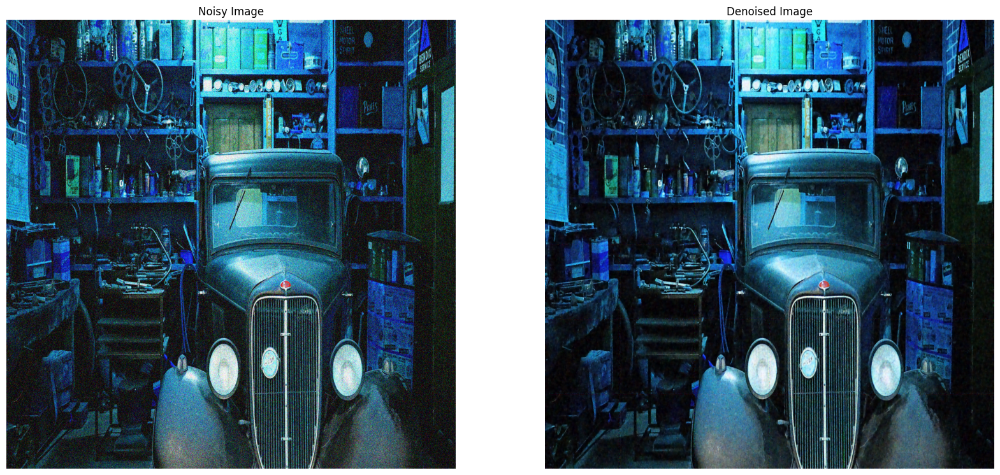

In [91]:
plot_test_results(noisy_test_path)

2/2 [==============================] - 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2035609930753708..1.14742112159729].


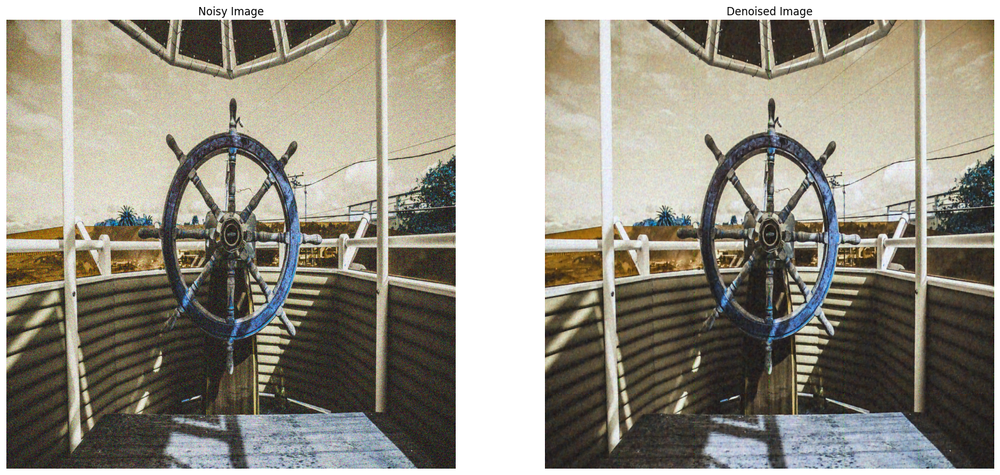

In [92]:
plot_test_results(noisy_test_path)

2/2 [==============================] - 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16423922777175903..1.1321759223937988].


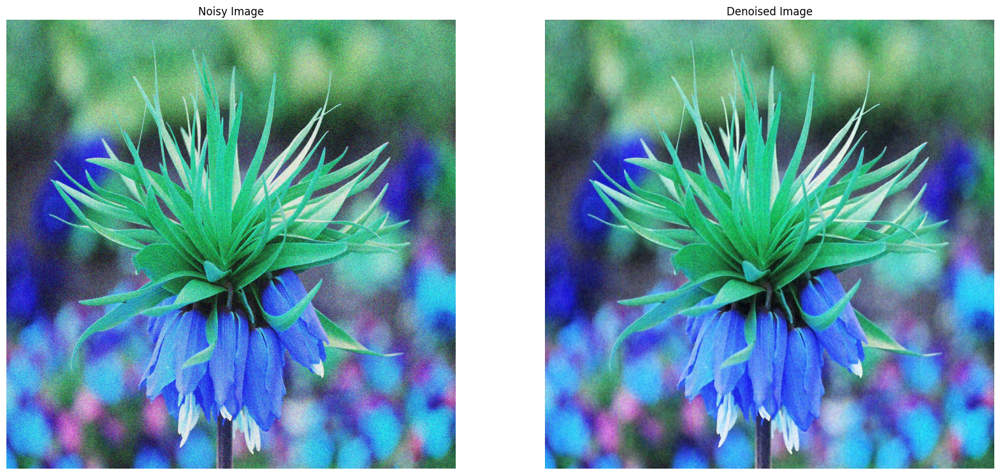

In [93]:
plot_test_results(noisy_test_path)

2/2 [==============================] - 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16679376363754272..1.0917861461639404].


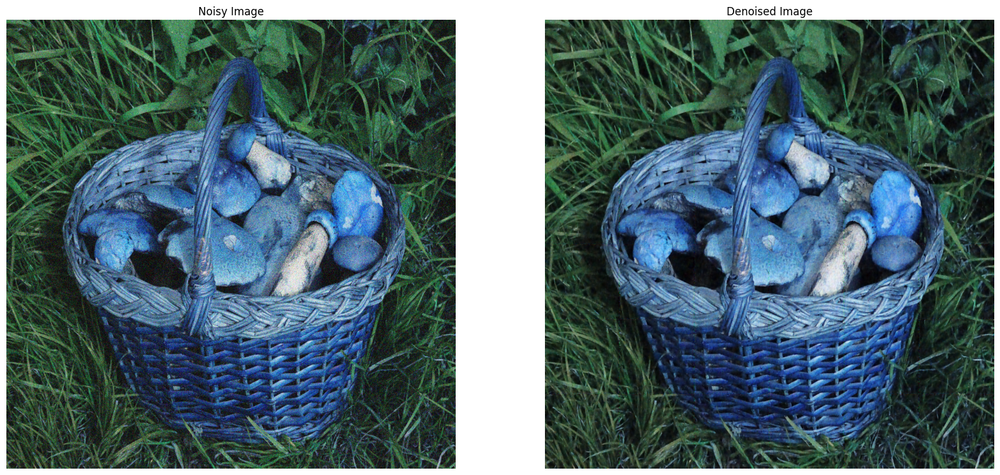

In [94]:
plot_test_results(noisy_test_path)

2/2 [==============================] - 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17029502987861633..1.1281211376190186].


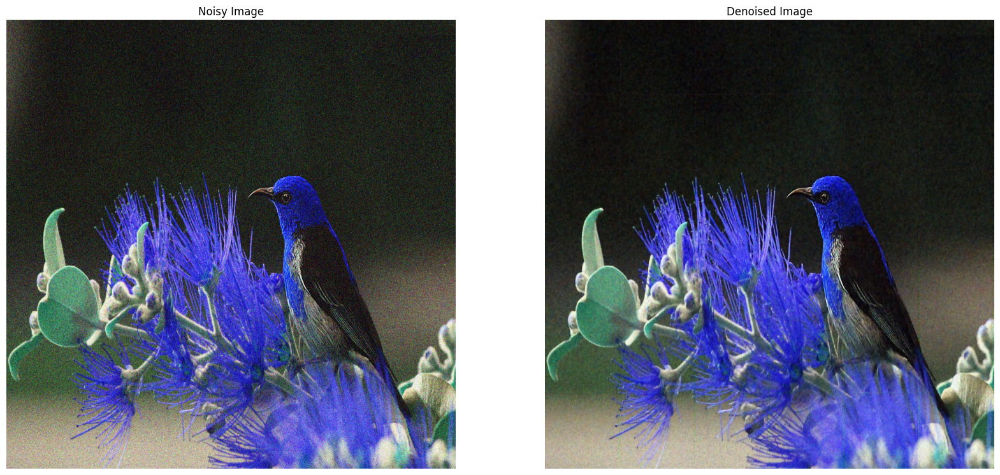

In [95]:
plot_test_results(noisy_test_path)